In [ ]:
pip install -r requirements.txt

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import great_expectations as gx
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf
from statsmodels.tsa.seasonal import MSTL
from scipy.fft import rfft, rfftfreq

pd.options.mode.copy_on_write = True 
cur_dir = os.getcwd()

### Data import

The data is spread across 6 files, named after gear faults.

In [2]:
dfs = []

for file_name in ['eccentricity', 'missing_tooth', 'no_fault', 'root_crack', 'surface_fault', 'tooth_chipped_fault']:
    df = pd.read_csv(cur_dir + '//data//' + file_name + '.csv')  # loading each file
    dfs.append(df)

    print(file_name + ':')
    print(df.shape)
    display(df.head(5))

eccentricity:
(150000, 6)


,sensor1,sensor2,time_x,speedSet,load_value,gear_fault_desc
0,2.522315,2.431974,2023-05-03 20:31:39.000000,8.332031,0,eccentricity
1,2.523629,2.431317,2023-05-03 20:31:39.000200,8.332031,0,eccentricity
2,2.522644,2.428032,2023-05-03 20:31:39.000400,8.332031,0,eccentricity
3,2.521987,2.430660,2023-05-03 20:31:39.000600,8.332031,0,eccentricity
4,2.522808,2.430168,2023-05-03 20:31:39.000800,8.332031,0,eccentricity


missing_tooth:
(150000, 6)


,sensor1,sensor2,time_x,speedSet,load_value,gear_fault_desc
0,2.520016,2.430496,2023-05-03 13:06:37.000000,8.332031,0,missing tooth
1,2.521822,2.430660,2023-05-03 13:06:37.000200,8.332031,0,missing tooth
2,2.519194,2.429511,2023-05-03 13:06:37.000400,8.332031,0,missing tooth
3,2.519851,2.428853,2023-05-03 13:06:37.000600,8.332031,0,missing tooth
4,2.518701,2.429346,2023-05-03 13:06:37.000800,8.332031,0,missing tooth


no_fault:
(150000, 6)


,sensor1,sensor2,time_x,speedSet,load_value,gear_fault_desc
0,2.523465,2.430168,2023-05-03 21:47:31.000000,8.332031,0,No fault
1,2.521494,2.430003,2023-05-03 21:47:31.000200,8.332031,0,No fault
2,2.522479,2.429675,2023-05-03 21:47:31.000400,8.332031,0,No fault
3,2.521330,2.431810,2023-05-03 21:47:31.000600,8.332031,0,No fault
4,2.522479,2.431317,2023-05-03 21:47:31.000800,8.332031,0,No fault


root_crack:
(150000, 6)


,sensor1,sensor2,time_x,speedSet,load_value,gear_fault_desc
0,2.519358,2.429675,2023-05-03 14:41:31.000000,8.332031,0,Root crack
1,2.519358,2.429839,2023-05-03 14:41:31.000200,8.332031,0,Root crack
2,2.521165,2.430496,2023-05-03 14:41:31.000400,8.332031,0,Root crack
3,2.520508,2.428853,2023-05-03 14:41:31.000600,8.332031,0,Root crack
4,2.519358,2.428689,2023-05-03 14:41:31.000800,8.332031,0,Root crack


surface_fault:
(150000, 6)


,sensor1,sensor2,time_x,speedSet,load_value,gear_fault_desc
0,2.521001,2.427539,2023-05-02 14:35:14.000000,8.332031,0,surface defect
1,2.519851,2.428196,2023-05-02 14:35:14.000200,8.332031,0,surface defect
2,2.520016,2.426225,2023-05-02 14:35:14.000400,8.332031,0,surface defect
3,2.520016,2.428689,2023-05-02 14:35:14.000600,8.332031,0,surface defect
4,2.521165,2.427047,2023-05-02 14:35:14.000800,8.332031,0,surface defect


tooth_chipped_fault:
(150000, 6)


,sensor1,sensor2,time_x,speedSet,load_value,gear_fault_desc
0,2.518209,2.430496,2023-05-02 15:53:07.000000,8.332031,0,chipped tooth
1,2.517880,2.429839,2023-05-02 15:53:07.000200,8.332031,0,chipped tooth
2,2.516402,2.427211,2023-05-02 15:53:07.000400,8.332031,0,chipped tooth
3,2.518537,2.427704,2023-05-02 15:53:07.000600,8.332031,0,chipped tooth
4,2.518701,2.427539,2023-05-02 15:53:07.000800,8.332031,0,chipped tooth


Contents of files look very similar, so they can be combined into one dataframe for easier manipulation.

In [3]:
df = pd.concat(dfs, ignore_index=True)
df.head()

,sensor1,sensor2,time_x,speedSet,load_value,gear_fault_desc
0,2.522315,2.431974,2023-05-03 20:31:39.000000,8.332031,0,eccentricity
1,2.523629,2.431317,2023-05-03 20:31:39.000200,8.332031,0,eccentricity
2,2.522644,2.428032,2023-05-03 20:31:39.000400,8.332031,0,eccentricity
3,2.521987,2.430660,2023-05-03 20:31:39.000600,8.332031,0,eccentricity
4,2.522808,2.430168,2023-05-03 20:31:39.000800,8.332031,0,eccentricity


For easier understanding, some columns are renamed.

In [4]:
df.rename(columns={'time_x': 'time', 'speedSet': 'speed', 'load_value': 'load', 'gear_fault_desc': 'fault'}, inplace=True)
df.head()

,sensor1,sensor2,time,speed,load,fault
0,2.522315,2.431974,2023-05-03 20:31:39.000000,8.332031,0,eccentricity
1,2.523629,2.431317,2023-05-03 20:31:39.000200,8.332031,0,eccentricity
2,2.522644,2.428032,2023-05-03 20:31:39.000400,8.332031,0,eccentricity
3,2.521987,2.430660,2023-05-03 20:31:39.000600,8.332031,0,eccentricity
4,2.522808,2.430168,2023-05-03 20:31:39.000800,8.332031,0,eccentricity


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900000 entries, 0 to 899999
Data columns (total 6 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   sensor1  900000 non-null  float64
 1   sensor2  900000 non-null  float64
 2   time     900000 non-null  object 
 3   speed    900000 non-null  float64
 4   load     900000 non-null  int64  
 5   fault    900000 non-null  object 
dtypes: float64(3), int64(1), object(2)
memory usage: 41.2+ MB


The dataframe contains no missing values.

In [6]:
df.describe()

,sensor1,sensor2,speed,load
count,900000.000000,900000.000000,900000.000000,900000.000000
mean,2.519877,2.429291,24.444010,40.000000
std,0.011236,0.012001,12.934378,40.000022
min,2.219428,2.161939,8.332031,0.000000
25%,2.516895,2.426390,8.332031,0.000000
50%,2.520180,2.429839,25.000000,40.000000
75%,2.522972,2.432303,40.000000,80.000000
max,2.820934,2.709896,40.000000,80.000000


### Validation

In [7]:
gx_context = gx.get_context()
data_source = gx_context.data_sources.add_pandas('pandas')
data_asset = data_source.add_dataframe_asset(name="vibrations_data")
batch_definition = data_asset.add_batch_definition_whole_dataframe("all_data")

In [8]:
suite = gx.ExpectationSuite(name='validations')

exp = gx.expectations.ExpectColumnValuesToNotBeNull(column='sensor1')
suite.add_expectation(exp)
exp = gx.expectations.ExpectColumnValuesToBeBetween(column='sensor1', min_value=0, max_value=3)
suite.add_expectation(exp)
exp = gx.expectations.ExpectColumnValuesToNotBeNull(column='sensor2')
suite.add_expectation(exp)
exp = gx.expectations.ExpectColumnValuesToBeBetween(column='sensor2', min_value=0, max_value=3)
suite.add_expectation(exp)
exp = gx.expectations.ExpectColumnValuesToNotBeNull(column='time')
suite.add_expectation(exp)
exp = gx.expectations.ExpectColumnValuesToNotBeNull(column='speed')
suite.add_expectation(exp)
exp = gx.expectations.ExpectColumnValuesToBeBetween(column='speed', min_value=8, max_value=40)
suite.add_expectation(exp)
exp = gx.expectations.ExpectColumnValuesToNotBeNull(column='load')
suite.add_expectation(exp)
exp = gx.expectations.ExpectColumnValuesToBeBetween(column='load', min_value=0, max_value=80)
suite.add_expectation(exp)
exp = gx.expectations.ExpectColumnValuesToNotBeNull(column='fault')
suite.add_expectation(exp)

suite = gx_context.suites.add(suite)

In [9]:
batch = batch_definition.get_batch(batch_parameters={"dataframe": df})

print('Successful validation:', 
       batch.validate(suite).success)

Calculating Metrics:   0%|          | 0/53 [00:00<?, ?it/s]

Successful validation: True


In [10]:
df.duplicated().sum()

0

In [11]:
df.duplicated(subset='time').sum()

0

Dataset has no duplicated records.

In [12]:
print('Speed unique values:', df['speed'].unique().tolist())
print('Load unique values:', df['load'].unique().tolist())
print('Fault unique values:', df['fault'].unique().tolist())

Speed unique values: [8.33203125, 25.0, 40.0]
Load unique values: [0, 80]
Fault unique values: ['eccentricity', 'missing tooth', 'No fault', 'Root crack', 'surface defect', 'chipped tooth']


Unique values are as described in the dataset description.

In [13]:
df.dtypes

sensor1    float64
sensor2    float64
time        object
speed      float64
load         int64
fault       object
dtype: object

Correcting data types.

In [14]:
df['time'] = pd.to_datetime(df['time'])
df['speed'] = df['speed'].astype(np.float32)
df['load'] = df['load'].astype(int)
df.dtypes

sensor1           float64
sensor2           float64
time       datetime64[ns]
speed             float32
load                int32
fault              object
dtype: object

In [15]:
print('Min time:', df['time'].min())
print('Max time:', df['time'].max())

Min time: 2023-05-02 10:30:01
Max time: 2023-05-07 17:11:48.999800


How many observations each gearbox run has.

In [16]:
for fault in df['fault'].unique():
    for load in df['load'].unique():
        for speed in df['speed'].unique():
            print(fault + '\t', 
                  str(load) + 'N\t', 
                  str(speed) + 'rps:\t', 
                  df[(df['fault'] == fault) & (df['load'] == load) & (df['speed'] == speed)].shape[0])

eccentricity	 0N	 8.332031rps:	 25000
eccentricity	 0N	 25.0rps:	 25000
eccentricity	 0N	 40.0rps:	 25000
eccentricity	 80N	 8.332031rps:	 25000
eccentricity	 80N	 25.0rps:	 25000
eccentricity	 80N	 40.0rps:	 25000
missing tooth	 0N	 8.332031rps:	 25000
missing tooth	 0N	 25.0rps:	 25000
missing tooth	 0N	 40.0rps:	 25000
missing tooth	 80N	 8.332031rps:	 25000
missing tooth	 80N	 25.0rps:	 25000
missing tooth	 80N	 40.0rps:	 25000
No fault	 0N	 8.332031rps:	 25000
No fault	 0N	 25.0rps:	 25000
No fault	 0N	 40.0rps:	 25000
No fault	 80N	 8.332031rps:	 25000
No fault	 80N	 25.0rps:	 25000
No fault	 80N	 40.0rps:	 25000
Root crack	 0N	 8.332031rps:	 25000
Root crack	 0N	 25.0rps:	 25000
Root crack	 0N	 40.0rps:	 25000
Root crack	 80N	 8.332031rps:	 25000
Root crack	 80N	 25.0rps:	 25000
Root crack	 80N	 40.0rps:	 25000
surface defect	 0N	 8.332031rps:	 25000
surface defect	 0N	 25.0rps:	 25000
surface defect	 0N	 40.0rps:	 25000
surface defect	 80N	 8.332031rps:	 25000
surface defect	 8

Now as we know observations amount, we can check if there are errors in timing within each gearbox run.

In [17]:
failed_count = 0

for fault in df['fault'].unique():
    for load in df['load'].unique():
        for speed in df['speed'].unique():
            measurements = df[(df['fault'] == fault) & (df['load'] == load) & (df['speed'] == speed)]
            if measurements['time'].min() + pd.Timedelta(seconds=0.0002*(25000-1)) != measurements['time'].max():
                failed_count += 1
                
print('Measurements intervals checks failed:', str(failed_count))

Measurements intervals checks failed: 0


Check if different runs overlap in time.

In [18]:
df_grouped = df.groupby(['fault', 'load', 'speed'])

df_time = pd.DataFrame()
df_time['start'] = df_grouped['time'].min()
df_time['end'] = df_grouped['time'].max()

df_time.sort_values('start', inplace=True)
df_time['overlap'] = None
df_time.iloc[df_time.shape[0] - 1, 2] = False  # last measurement has no future measurement to overlap with

for i in range(df_time.shape[0] - 1):
    if df_time.iloc[i, 1] >= df_time.iloc[i + 1, 0]:
        df_time.iloc[i, 2] = True
    else:
        df_time.iloc[i, 2] = False

df_time = df_time.sort_values(['fault', 'load', 'speed'])

display(df_time)
print('Amount of gearbox runs:', df_time.shape[0])

start                        end  \
fault          load speed                                                      
No fault       0    8.332031  2023-05-03 21:47:31 2023-05-03 21:47:35.999800   
                    25.000000 2023-05-02 11:29:24 2023-05-02 11:29:28.999800   
                    40.000000 2023-05-03 22:10:00 2023-05-03 22:10:04.999800   
               80   8.332031  2023-05-03 21:49:08 2023-05-03 21:49:12.999800   
                    25.000000 2023-05-02 10:30:01 2023-05-02 10:30:05.999800   
                    40.000000 2023-05-03 22:06:02 2023-05-03 22:06:06.999800   
Root crack     0    8.332031  2023-05-03 14:41:31 2023-05-03 14:41:35.999800   
                    25.000000 2023-05-03 14:59:07 2023-05-03 14:59:11.999800   
                    40.000000 2023-05-03 15:01:03 2023-05-03 15:01:07.999800   
               80   8.332031  2023-05-03 14:41:52 2023-05-03 14:41:56.999800   
                    25.000000 2023-05-03 14:55:50 2023-05-03 14:55:54.999800   
                    40.000000 2023-05-03 15:03:37 2023-05-03 15:03:41.999800   
chipped tooth  0    8.332031  2023-05-02 15:53:07 2023-05-02 15:53:11.999800   
                    25.000000 2023-05-02 15:54:32 2023-05-02 15:54:36.999800   
                    40.000000 2023-05-02 15:55:01 2023-05-02 15:55:05.999800   
               80   8.332031  2023-05-02 16:04:29 2023-05-02 16:04:33.999800   
                    25.000000 2023-05-02 16:31:58 2023-05-02 16:32:02.999800   
                    40.000000 2023-05-02 16:40:19 2023-05-02 16:40:23.999800   
eccentricity   0    8.332031  2023-05-03 20:31:39 2023-05-03 20:31:43.999800   
                    25.000000 2023-05-03 20:20:00 2023-05-03 20:20:04.999800   
                    40.000000 2023-05-03 20:28:05 2023-05-03 20:28:09.999800   
               80   8.332031  2023-05-03 20:34:17 2023-05-03 20:34:21.999800   
                    25.000000 2023-05-03 20:22:05 2023-05-03 20:22:09.999800   
                    40.000000 2023-05-03 20:29:35 2023-05-03 20:29:39.999800   
missing tooth  0    8.332031  2023-05-03 13:06:37 2023-05-03 13:06:41.999800   
                    25.000000 2023-05-03 12:33:31 2023-05-03 12:33:35.999800   
                    40.000000 2023-05-03 12:28:17 2023-05-03 12:28:21.999800   
               80   8.332031  2023-05-03 13:07:23 2023-05-03 13:07:27.999800   
                    25.000000 2023-05-03 12:35:18 2023-05-03 12:35:22.999800   
                    40.000000 2023-05-03 12:26:50 2023-05-03 12:26:54.999800   
surface defect 0    8.332031  2023-05-02 14:35:14 2023-05-02 14:35:18.999800   
                    25.000000 2023-05-02 14:29:41 2023-05-02 14:29:45.999800   
                    40.000000 2023-05-07 17:11:44 2023-05-07 17:11:48.999800   
               80   8.332031  2023-05-02 14:31:46 2023-05-02 14:31:50.999800   
                    25.000000 2023-05-02 14:30:26 2023-05-02 14:30:30.999800   
                    40.000000 2023-05-07 17:10:11 2023-05-07 17:10:15.999800   

                              overlap  
fault          load speed              
No fault       0    8.332031    False  
                    25.000000   False  
                    40.000000   False  
               80   8.332031    False  
                    25.000000   False  
                    40.000000   False  
Root crack     0    8.332031    False  
                    25.000000   False  
                    40.000000   False  
               80   8.332031    False  
                    25.000000   False  
                    40.000000   False  
chipped tooth  0    8.332031    False  
                    25.000000   False  
                    40.000000   False  
               80   8.332031    False  
                    25.000000   False  
                    40.000000   False  
eccentricity   0    8.332031    False  
                    25.000000   False  
                    40.000000   False  
               80   8.332031    False  
                    25.000000   False  
   

Amount of gearbox runs: 36


As everything seems to be ok with time of observations, feature time can be used as index.

In [19]:
df.set_index('time', inplace=True)
df.sort_index(inplace=True)

Saving complete dataset into one file for future use.

In [20]:
df.to_csv(cur_dir + '//data//whole_dataset.csv')

In [21]:
df.head(5)

,sensor1,sensor2,speed,load,fault
time,,,,,
2023-05-02 10:30:01.000000,2.518537,2.425404,25.0,80,No fault
2023-05-02 10:30:01.000200,2.516730,2.427211,25.0,80,No fault
2023-05-02 10:30:01.000400,2.514267,2.428032,25.0,80,No fault
2023-05-02 10:30:01.000600,2.516895,2.432796,25.0,80,No fault
2023-05-02 10:30:01.000800,2.520016,2.427375,25.0,80,No fault


### EDA

First let's look at time plots. To make the plot not that big, these plots show only signal amplitude.<br/>
Data related to Sensor 2 will be always displayed in green.

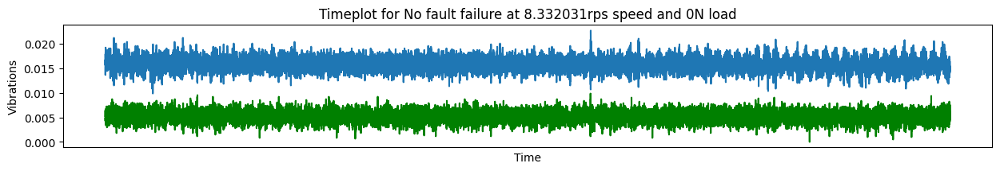

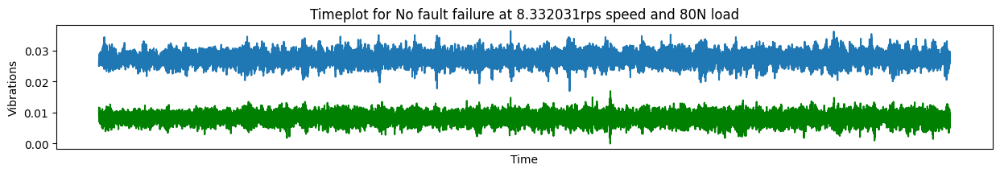

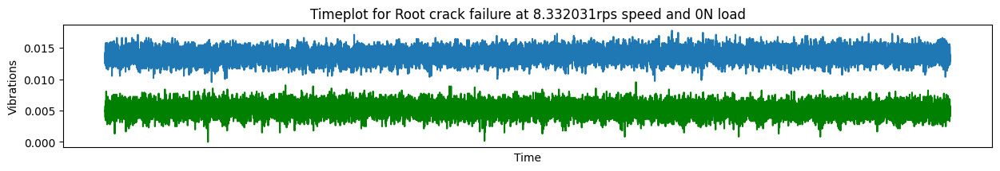

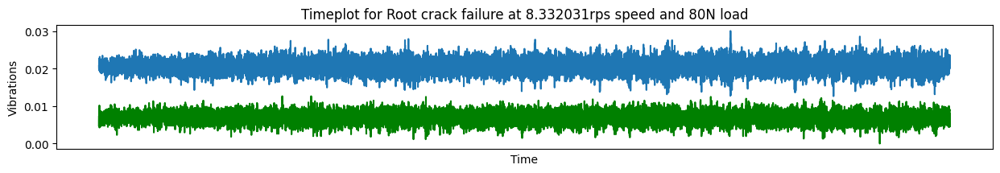

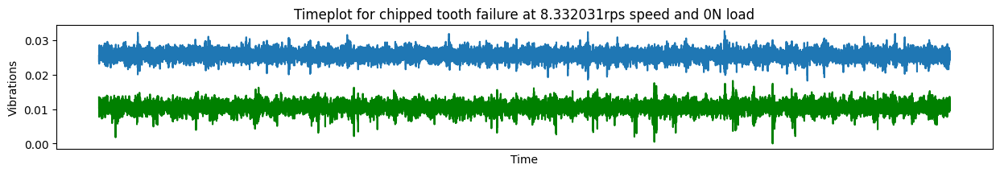

...

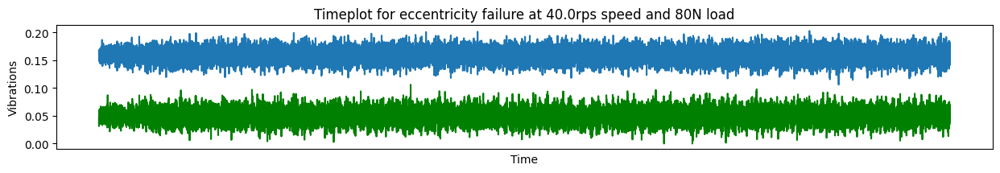

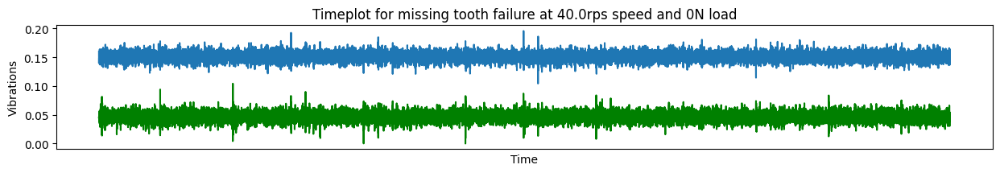

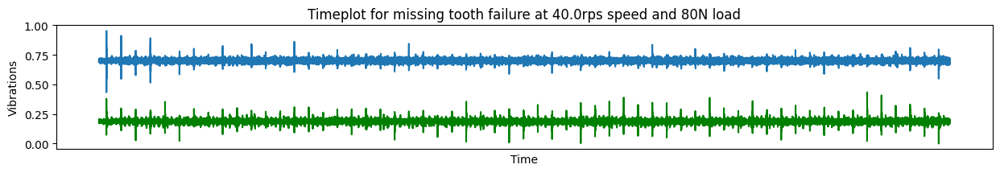

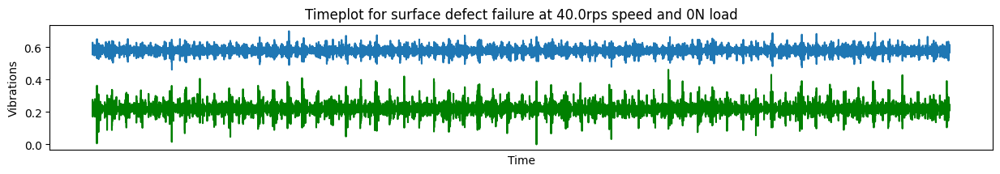

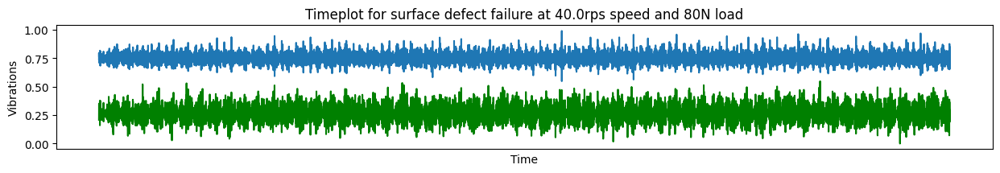

In [22]:
# making lists for easier iterating over different runs
fault_lst = sorted(df['fault'].unique())
speed_lst = sorted(df['speed'].unique())
load_lst = sorted(df['load'].unique())

plt.rc("figure", figsize=(15, 2))  

for speed in speed_lst:
    for fault in fault_lst:    
        for load in load_lst:
            measurements = df[(df['fault'] == fault) & (df['load'] == load) & (df['speed'] == speed)]

            measurements.loc[:, 'sensor2'] -= measurements['sensor2'].min()  # making the plot "touching zero"
            measurements.loc[:, 'sensor1'] -= (measurements['sensor1'].min() - 
                                               measurements['sensor2'].max())  # making the plot staying above previous
            
            sns.lineplot(measurements, x='time', y='sensor1')
            sns.lineplot(measurements, x='time', y='sensor2', color='g')

            plt.title('Timeplot for ' + fault + ' failure at ' + str(speed) + 'rps speed and ' + str(load) + 'N load')
            plt.xlabel('Time')
            plt.ylabel('Vibrations')
            plt.xticks([])
            plt.show()

- gear with missing tooth shows seasonal peaks on plots of 8rps, but this seasonality is different between no load and 80N load, which should not happen if it is caused exclusively by missing tooth. Also this event happens 12-13 times per 5 seconds that doesn't match speed of 8rps. Such behavior suggests resonances in the system.

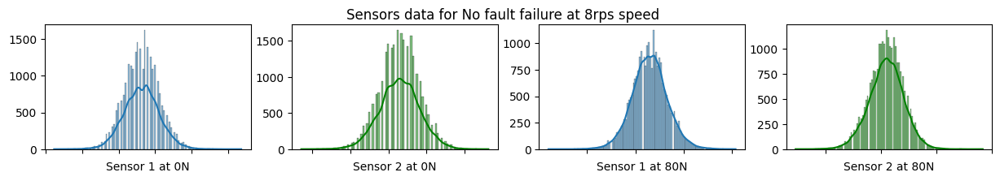

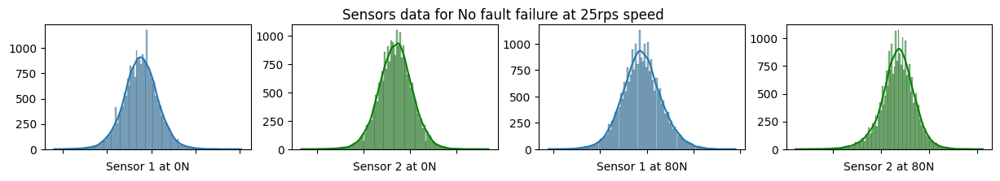

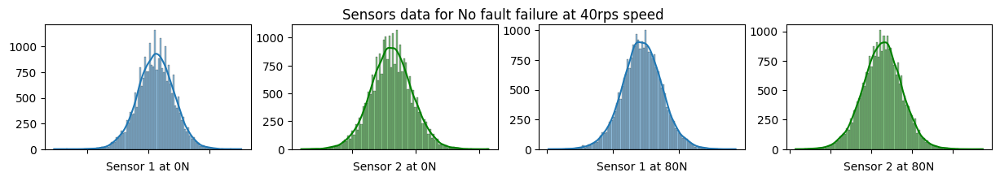

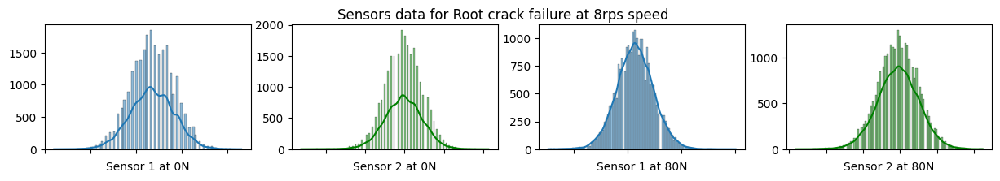

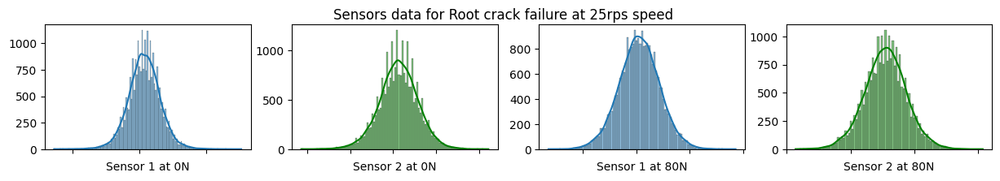

...

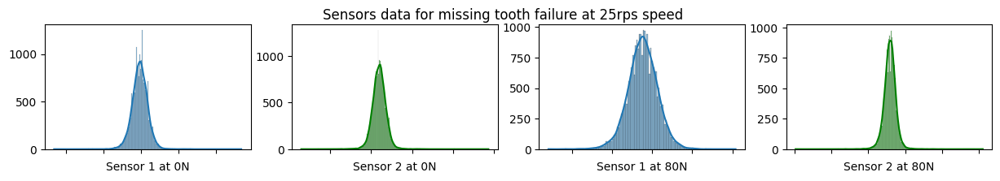

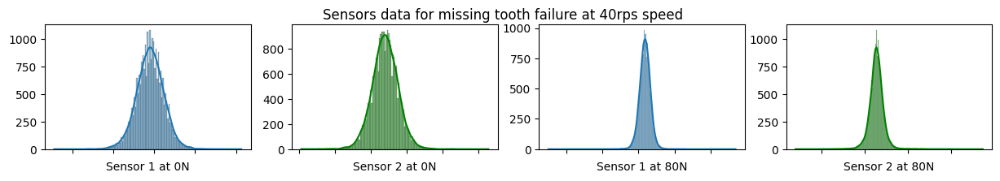

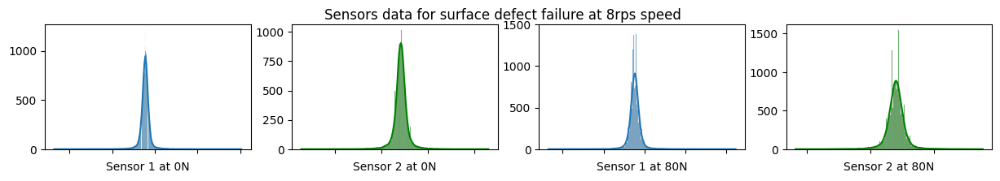

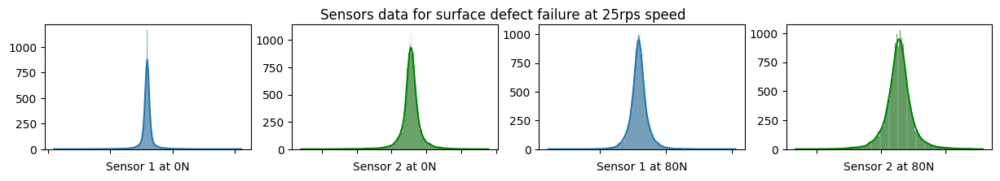

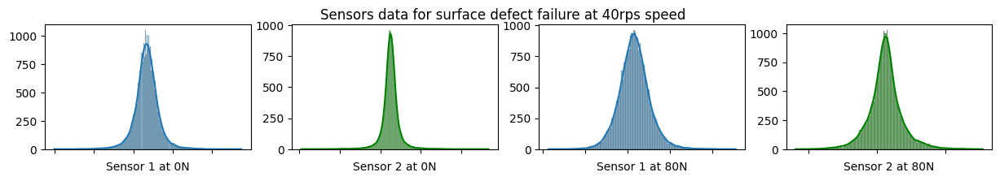

In [23]:
for fault in fault_lst:
    for speed in speed_lst:
        fig, ax = plt.subplots(1, 4, figsize=(15, 2))
        fig.suptitle('Sensors data for ' + fault + ' failure at ' + str(int(speed)) + 'rps speed')

        measurements = df[(df['fault'] == fault) & (df['load'] == 0) & (df['speed'] == speed)]
        
        sns.histplot(measurements, x='sensor1', ax=ax[0], kde=True)
        ax[0].set_xlabel('Sensor 1 at 0N')
        ax[0].set_ylabel('')
        ax[0].set_xticklabels([])
        
        sns.histplot(measurements, x='sensor2', ax=ax[1], color='green', kde=True)
        ax[1].set_xlabel('Sensor 2 at 0N')
        ax[1].set_ylabel('')   
        ax[1].set_xticklabels([])       

        measurements = df[(df['fault'] == fault) & (df['load'] == 80) & (df['speed'] == speed)]
        
        sns.histplot(measurements, x='sensor1', ax=ax[2], kde=True)
        ax[2].set_xlabel('Sensor 1 at 80N')
        ax[2].set_ylabel('')
        ax[2].set_xticklabels([])
        
        sns.histplot(measurements, x='sensor2', ax=ax[3], color='g', kde=True)
        ax[3].set_xlabel('Sensor 2 at 80N')
        ax[3].set_ylabel('')
        ax[3].set_xticklabels([])
        
        plt.show()

- load has minor effect on measured vibrations spectrum

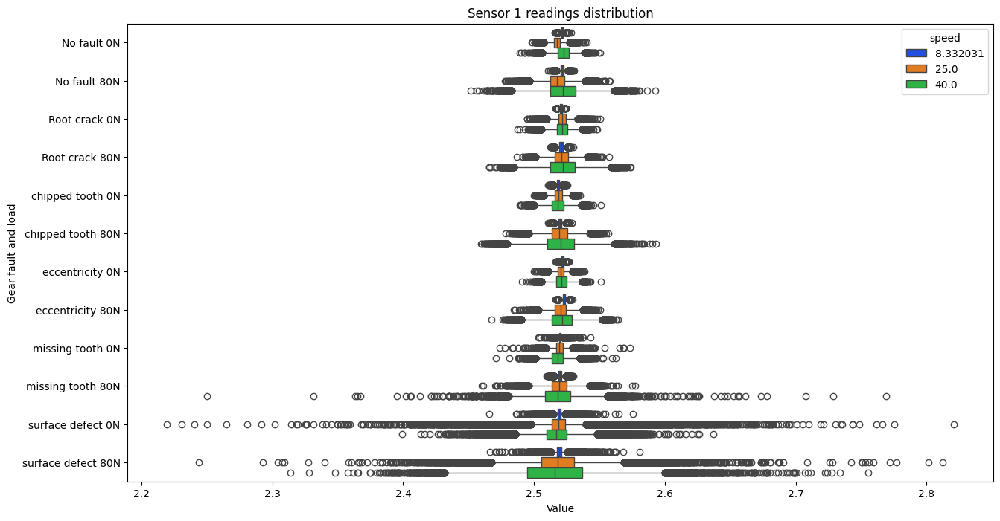

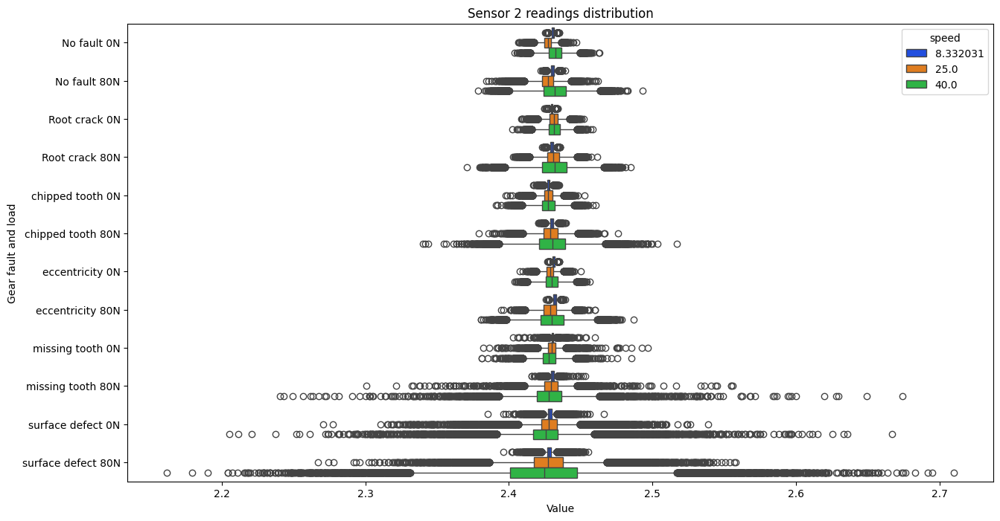

In [24]:
df['fault_load'] = df['fault'] + ' ' + df['load'].astype(str) + 'N'
plt.rc("figure", figsize=(15, 8)) 

sns.boxplot(df.sort_values(by='fault_load'), x='sensor1', y='fault_load', hue='speed', palette='bright')
plt.xlabel('Value')
plt.ylabel('Gear fault and load')
plt.title('Sensor 1 readings distribution')
plt.show()

sns.boxplot(df.sort_values(by='fault_load'), x='sensor2', y='fault_load', hue='speed', palette='bright')
plt.xlabel('Value')
plt.ylabel('Gear fault and load')
plt.title('Sensor 2 readings distribution')
plt.show()

df.drop(columns='fault_load', inplace=True)

- missing tooth at 80N load and surface defect provide the biggest amount of noise
- speed and load increase amplitude except for surface defect

To make this notebook not as huge as it can be, I reduce amount of data on some kinds plots.

In [25]:
fault_lst_short = ['No fault', 'eccentricity']
speed_lst_short = speed_lst.copy()
speed_lst_short.remove(40)

Measurements have too many seasons(revolutions) to be conviniantly displayed at once. That's why only 5 seasons are shown on plots below.<br>
To prevent overlapping, each next revolution(season) is shifted from previous one.

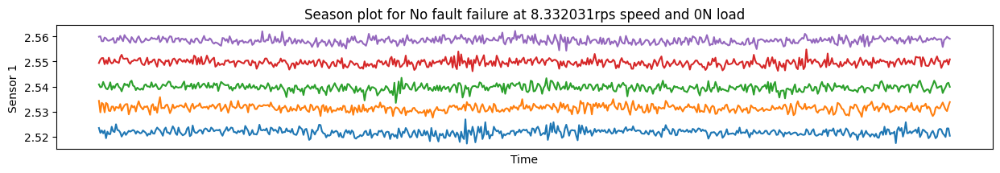

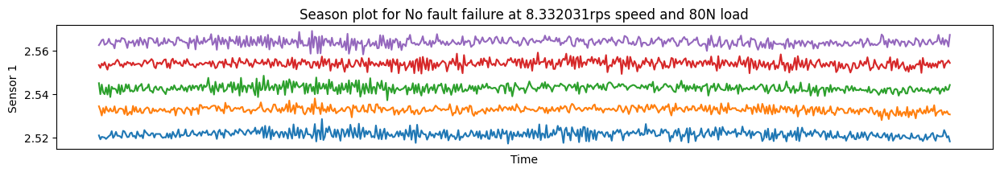

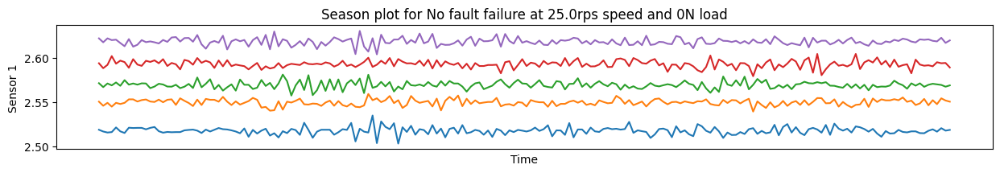

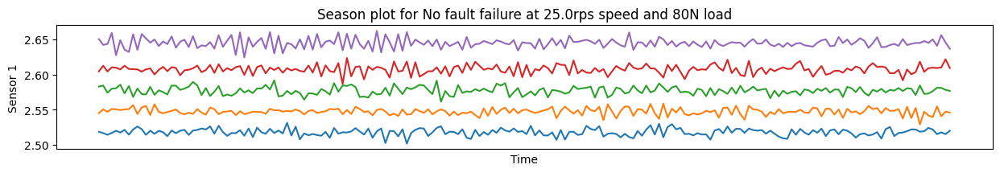

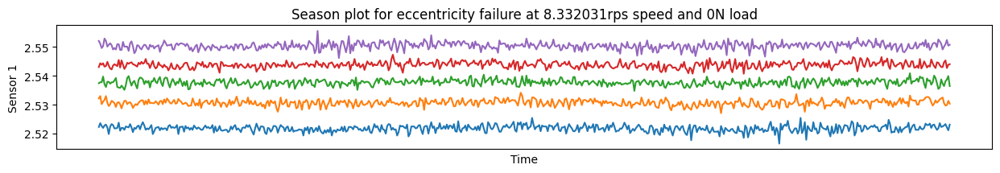

...

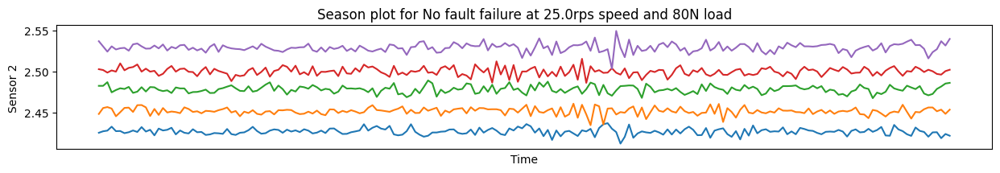

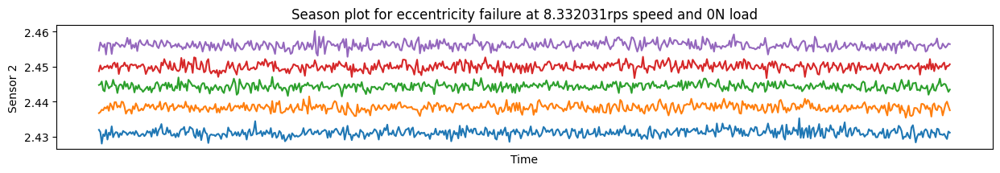

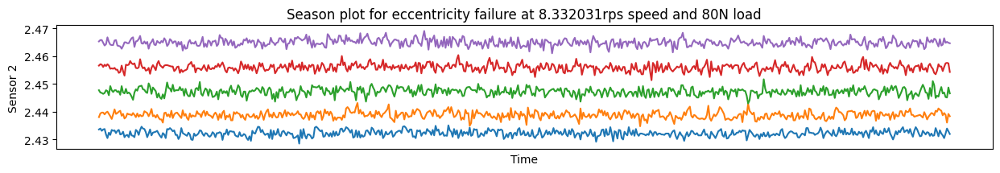

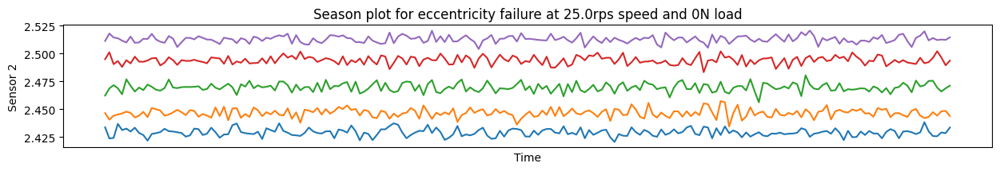

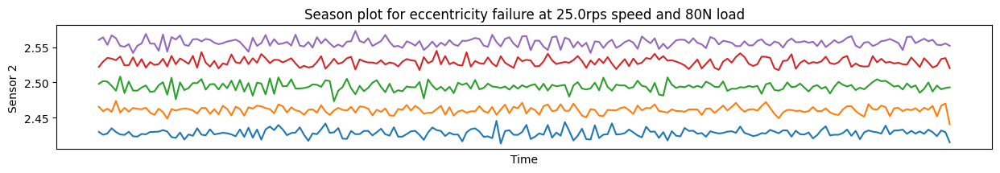

In [26]:
plt.rc("figure", figsize=(15, 2))  

for sensor in [1, 2]:  # cell numbers for sensor1 and sensor2
    for fault in fault_lst_short: 
        for speed in speed_lst_short:    
            period = int(1/speed/0.0002)  # amount of samples per revolution    
           
            for load in load_lst:            
                measurements = df[(df['fault'] == fault) & (df['load'] == load) & (df['speed'] == speed)]

                offset = 0
                for i in range(5):     
                    season = measurements.iloc[period * i : period * (i+1), sensor - 1]
                    sns.lineplot(x=range(period), y=season + offset)
                    offset += season.max() - season.min()
                    
                plt.title('Season plot for ' + fault + ' failure at ' + str(speed) + 
                          'rps speed and ' + str(load) + 'N load')
                plt.xlabel('Time')
                plt.ylabel('Sensor ' + str(sensor))
                plt.xticks([])
                plt.show()                

- load and speed increase vibrations amplitude
- there are several seasonalities in revolution, but they are almost indistinguishable
- sensors have similar vibrations amplitude, but different absolute values
- missing tooth causes spikes in readings once per several rotations. Possibly because of resonances.

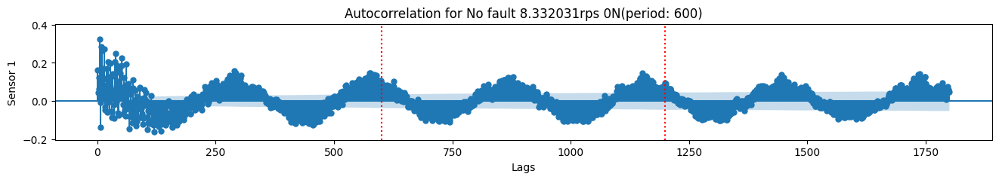

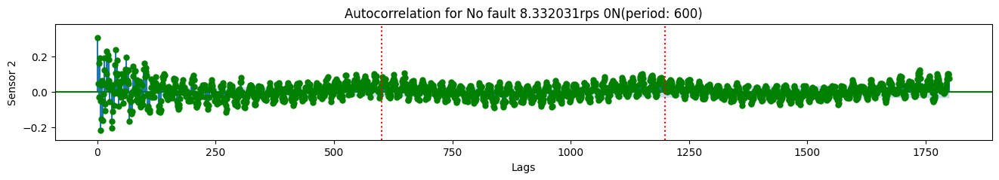

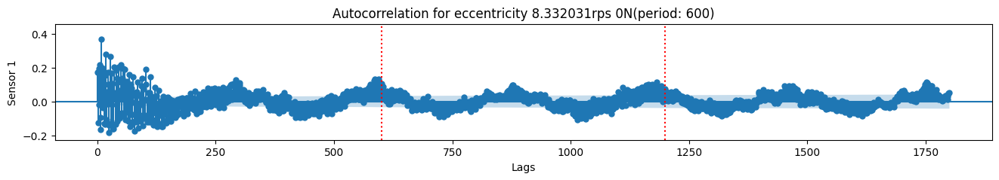

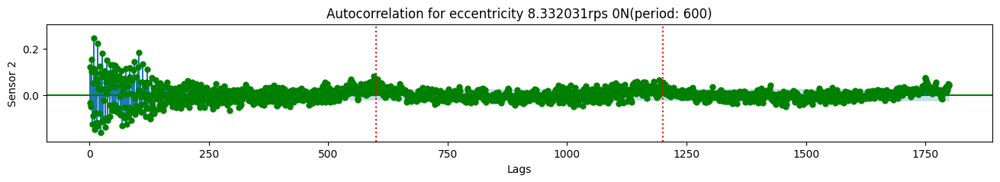

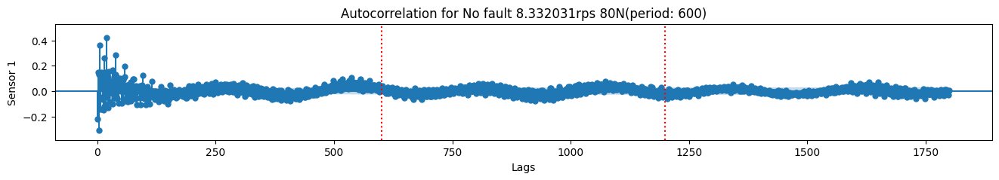

...

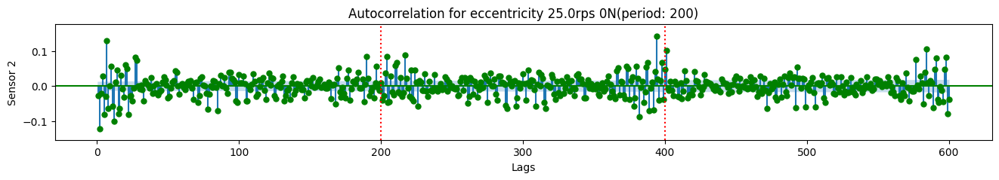

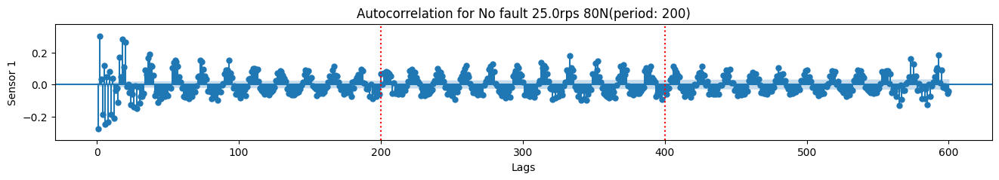

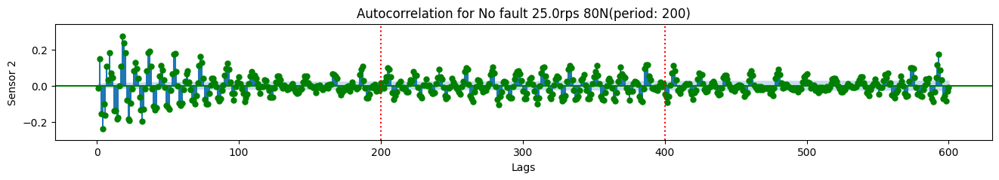

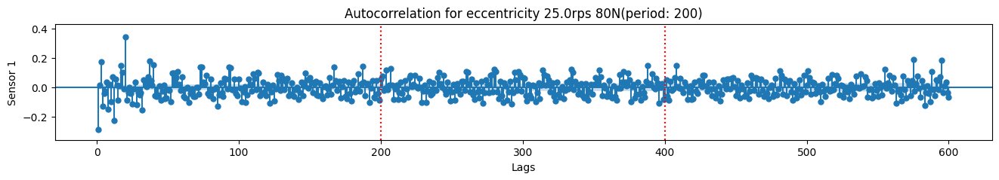

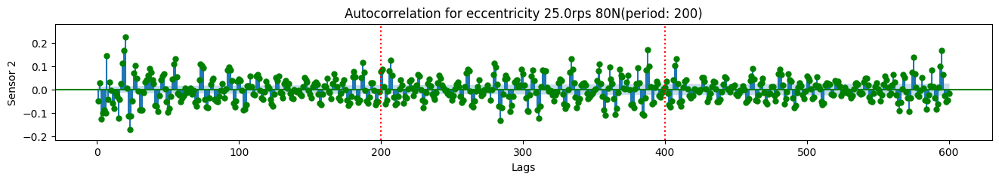

In [27]:
def autocorrelation_plot(revolutions, fault_lst, load_lst, speed_lst, sensor_lst, partial): 
    plt.rc("figure", figsize=(16, 2))  
    
    for speed in speed_lst_short:   
        period = int(1/speed/0.0002)  # amount of samples per revolution 
        lags = revolutions*period
        
        for load in load_lst: 
            for fault in fault_lst_short:   
                for sensor in sensor_lst:  # cell numbers for sensor1 and sensor2
                    measurements = df[(df['fault'] == fault) & (df['load'] == load) & (df['speed'] == speed)]
                    
                    if partial:
                        plot_pacf(measurements.iloc[:, sensor-1], lags=lags, 
                                  zero=False, auto_ylims=True, color='g' if sensor == 2 else 'C0')
                    else:
                        plot_acf(measurements.iloc[:, sensor-1], lags=lags, 
                                 zero=False, auto_ylims=True, color='g' if sensor == 2 else 'C0')
                
                    for i in range(1, revolutions):
                        plt.axvline(x=i*period, color='r', linestyle=':')
                    
                    plt.ylabel('Sensor ' + str(sensor))
                    plt.xlabel('Lags')
                    plt.title('Autocorrelation for ' + fault  + ' ' + str(speed) + 'rps ' + 
                              str(load) + 'N(period: ' + str(period) + ')')
                    plt.show()

autocorrelation_plot(3, fault_lst, load_lst, speed_lst, [1, 2], False)

- sensor1 8rps 0N plots show seasonality with frequency approx 2 per revolution. On plots of runs with 80N we can see that this frequency changes
- sensor2 plots show seasonality that looks like vibrations produced by gear teeth contacts, but frequency changes over different conditions, unlike gear teeth amount
- sensor2 plots at 8rps also display seasonality with frequency 1 per revolution, but it's not visible on 25rps plots

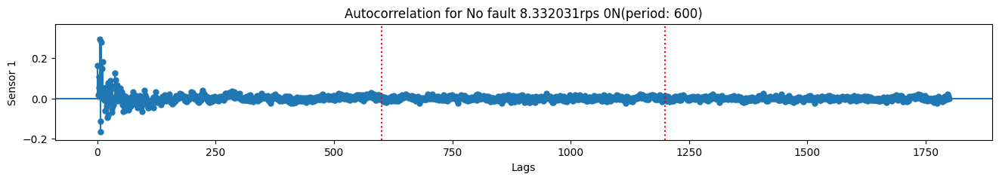

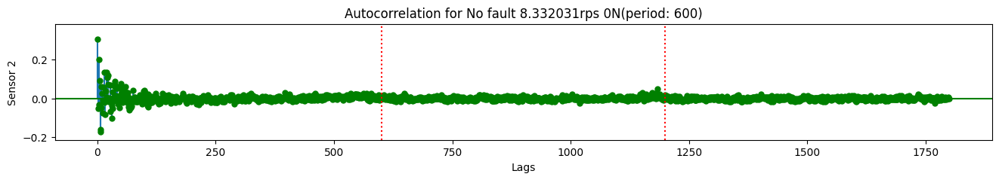

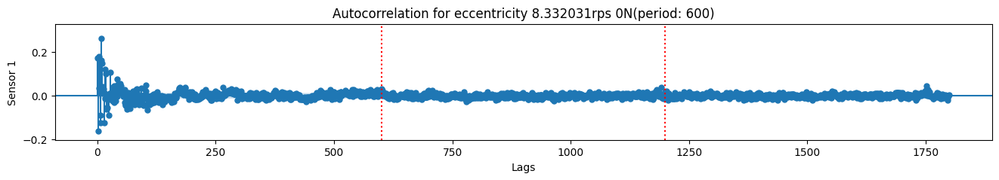

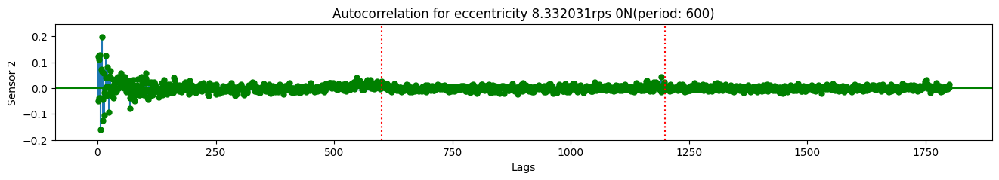

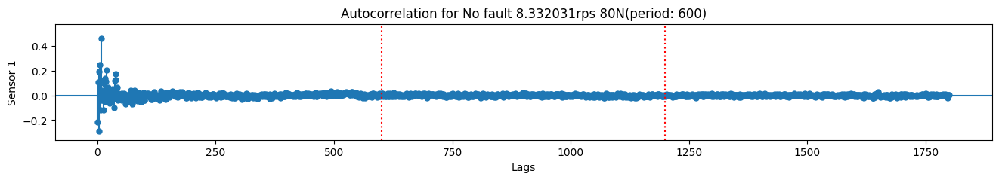

...

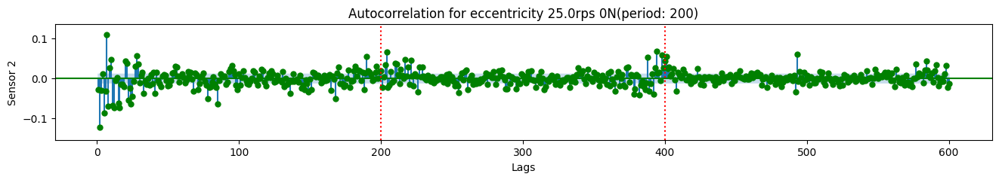

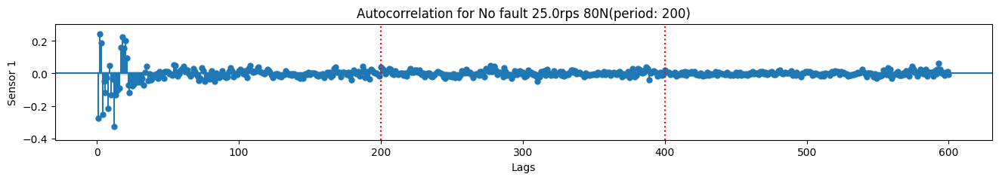

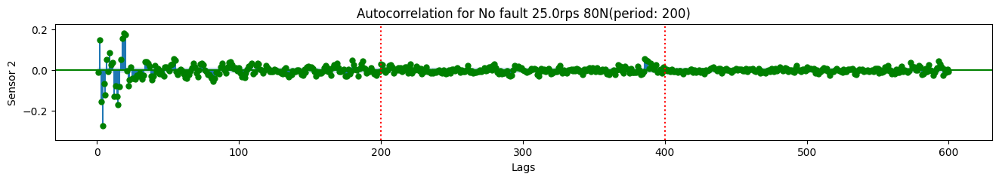

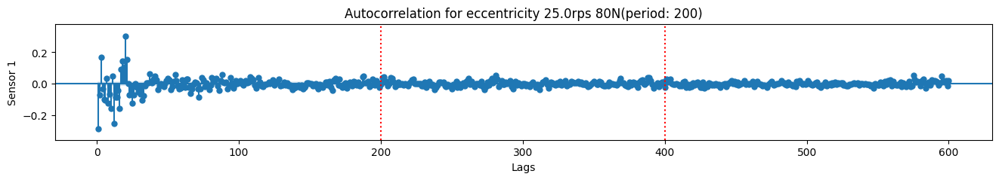

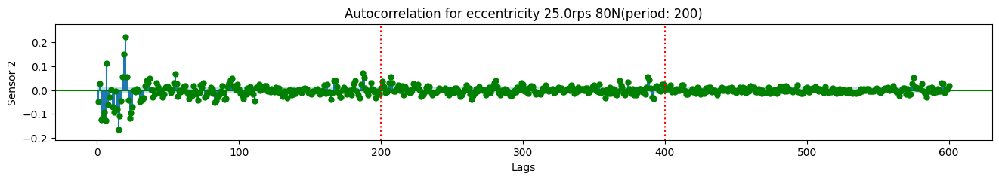

In [28]:
autocorrelation_plot(3, fault_lst, load_lst, speed_lst, [1, 2], True)

Partial autocorrelation plots show no interesting results

Autocorrelation plots showed several seasonalities, which we can try to use for signal decomposition. 

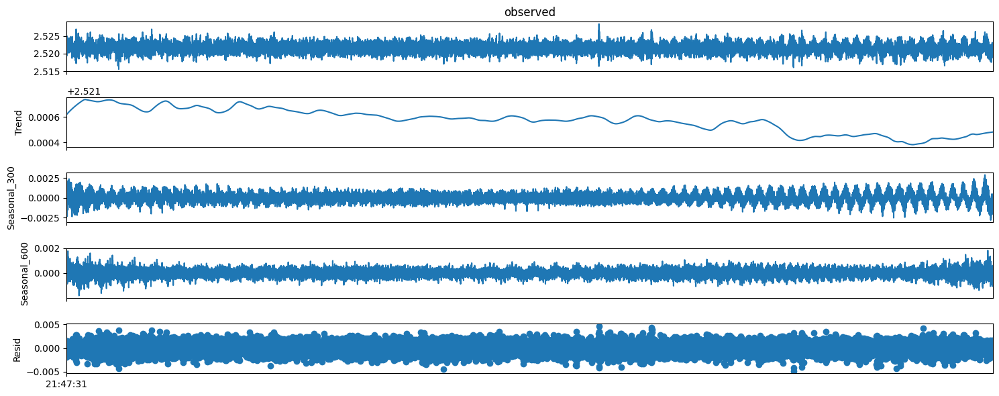

In [29]:
plt.rc("figure", figsize=(15, 6)) 

measurements = df[(df['fault'] == fault_lst[0]) & (df['load'] == load_lst[0]) & (df['speed'] == speed_lst[0])]  

res = MSTL(measurements['sensor1'], periods=(600, 300)).fit()
res.plot()
plt.tight_layout()

Only a fraction of the signal was captured in seasonal components, showing that decomposition likely isn't the best tool for the task.

How frequencies spectrums of different runs differ from each other? Let's look at frequencies of sensor 1. 

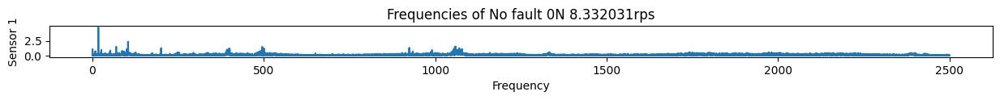

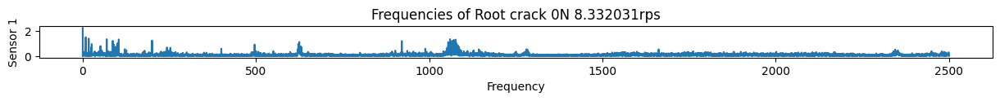

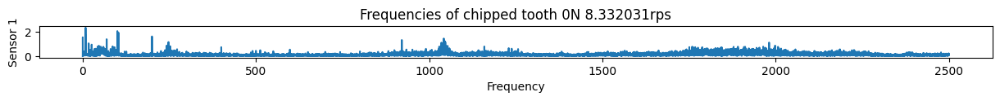

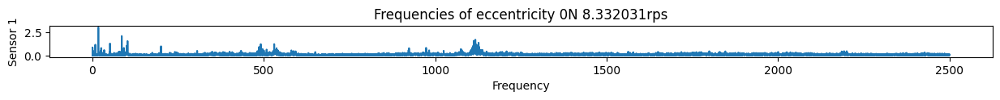

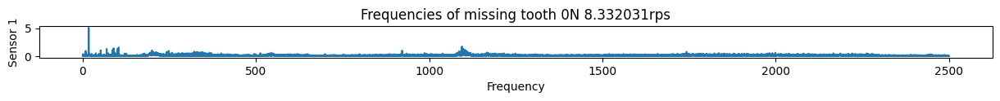

...

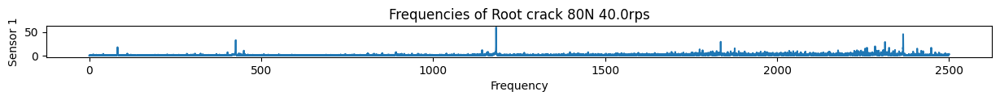

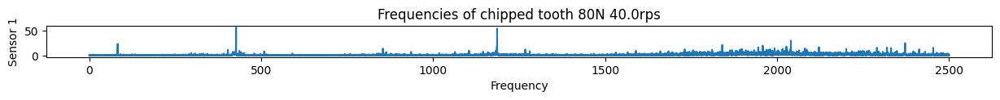

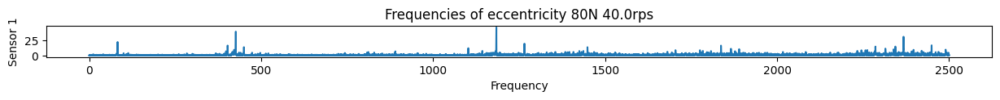

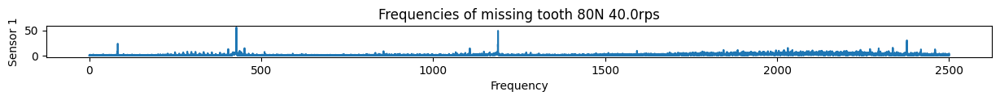

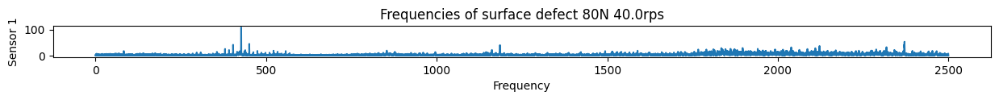

In [30]:
plt.rc("figure", figsize=(15, 0.5))  

for load in load_lst: 
    for speed in speed_lst:   
        period = int(1/speed/0.0002)  # amount of samples per revolution   
        for fault in fault_lst:  
            measurements = df[(df['fault'] == fault) & (df['load'] == load) & (df['speed'] == speed)]
            
            yf = rfft(measurements['sensor1'].values)
            xf = rfftfreq(measurements.shape[0], 1/5000)       
            yf[0] = 0
            sns.lineplot(x=xf, y=np.abs(yf))
            plt.xlabel('Frequency')
            plt.ylabel('Sensor 1')
            plt.title('Frequencies of ' + fault + ' ' + str(load) + 'N ' + str(speed) + 'rps')
            plt.show()

- 8rps runs have peaks close to 0. These peaks shift further from 0 with speed increase
- each gear fault adds some patterns to corresponding spectrum
- adding load significantly changes spectrums due to introducing additional sources of noise

What can we find in frequencies spectrum of sensor 2?

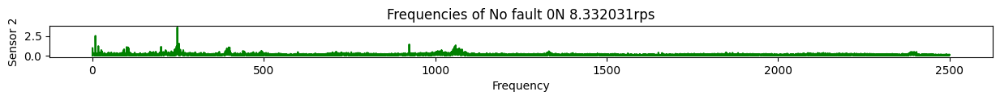

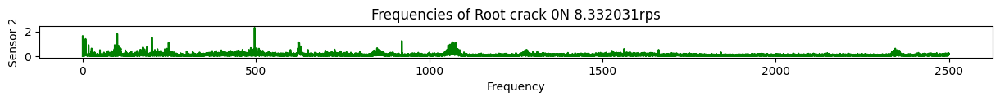

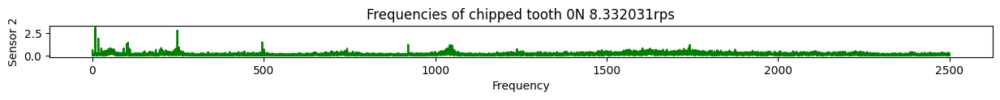

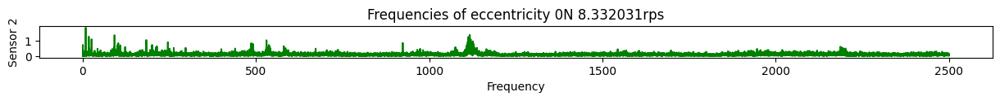

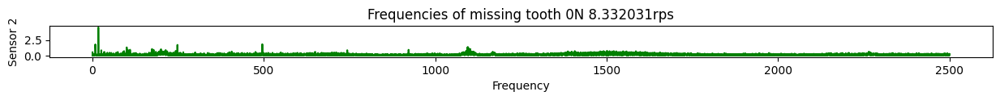

...

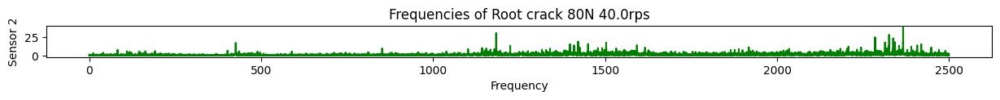

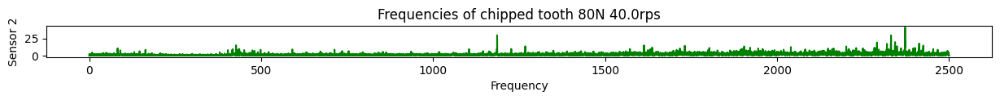

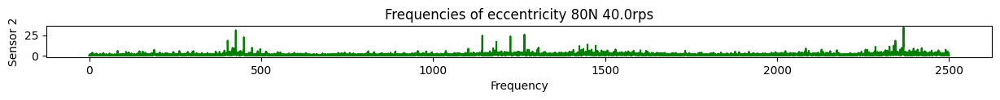

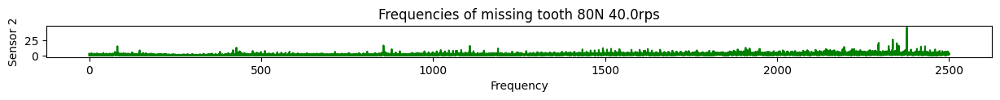

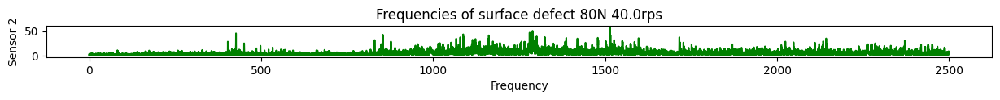

In [31]:
plt.rc("figure", figsize=(15, 0.5))  

for load in load_lst: 
    for speed in speed_lst:   
        period = int(1/speed/0.0002)  # amount of samples per revolution   
        for fault in fault_lst:  
            measurements = df[(df['fault'] == fault) & (df['load'] == load) & (df['speed'] == speed)]
            
            yf = rfft(measurements['sensor2'].values)
            xf = rfftfreq(measurements.shape[0], 1/5000)             
            yf[0] = 0
            sns.lineplot(x=xf, y=np.abs(yf), color='g')
            plt.xlabel('Frequency')
            plt.ylabel('Sensor 2')
            plt.title('Frequencies of ' + fault + ' ' + str(load) + 'N ' + str(speed) + 'rps')
            plt.show()

Sensor 2 frequencies show similar behavior to sensor 1, but with different patterns.

As plots above show, it's possible to distinguish readings for different speeds by frequency spectrum.<br/>
This should be also possible to do, having only frequencies for rotation speed range, because everything more than that is not a direct derivative of gear rotation and thus speed.

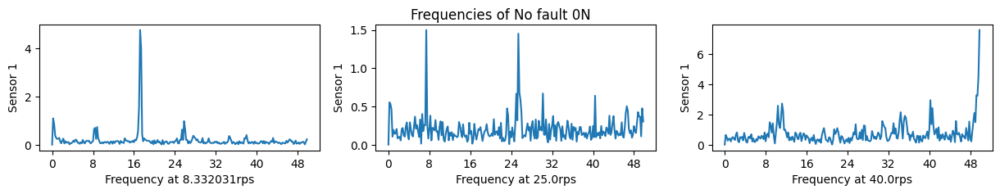

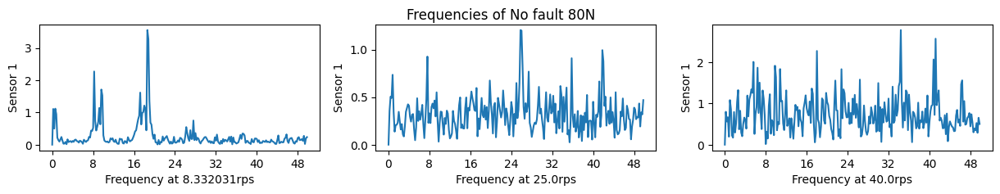

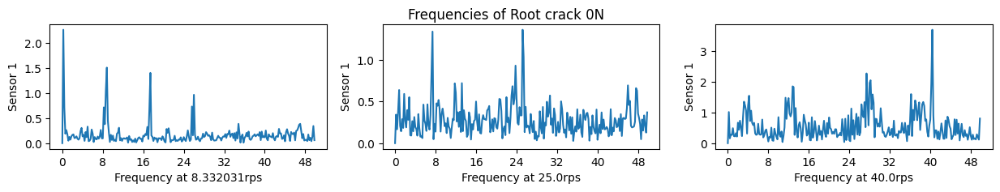

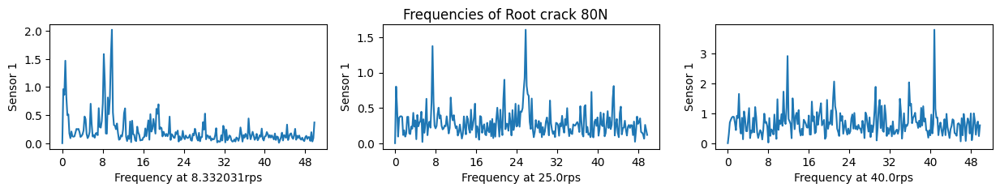

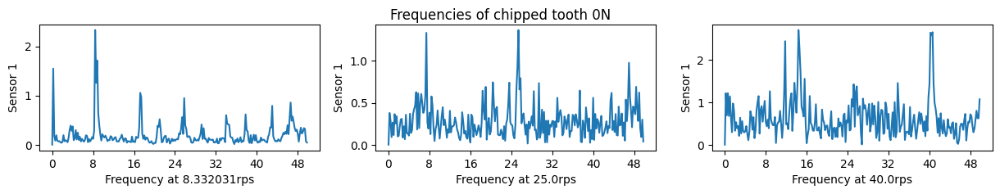

...

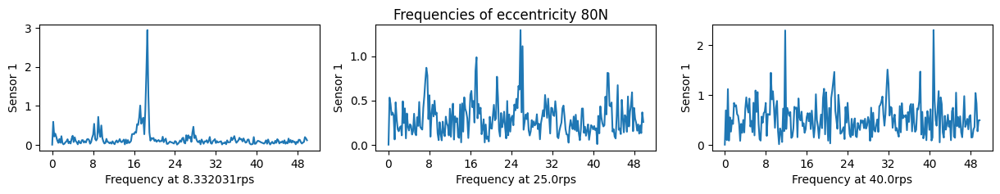

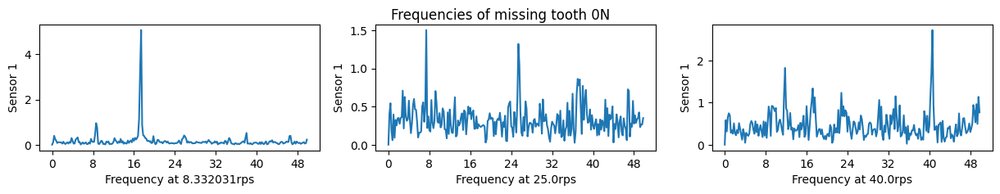

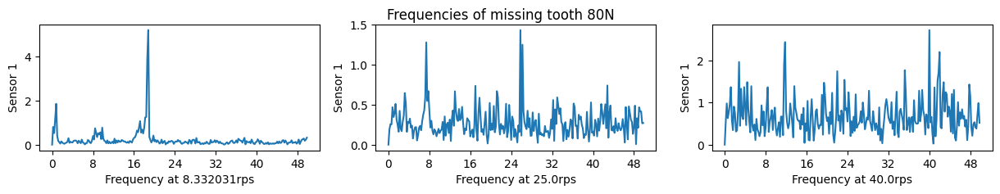

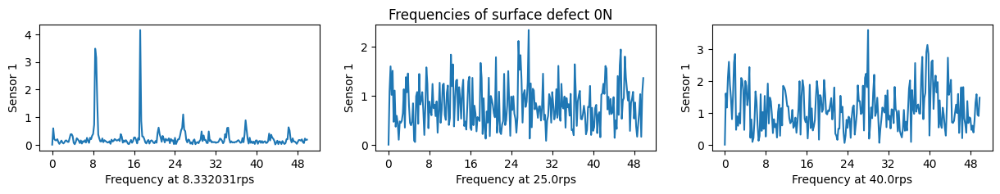

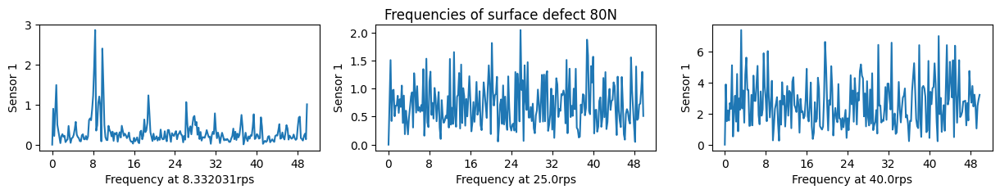

In [32]:
for fault in sorted(df['fault'].unique()):
    for load in load_lst:
        fig, ax = plt.subplots(1, 3, figsize=(15, 2))
        fig.suptitle('Frequencies of ' + fault + ' ' + str(load) + 'N')
        
        for i, speed in enumerate(sorted(df['speed'].unique())):    
            measurements = df.loc[(df['fault'] == fault) & (df['load'] == load) & (df['speed'] == speed), 'sensor1']
            
            yf = rfft(measurements.values)[:250]      
            xf = rfftfreq(measurements.shape[0], 1/5000)[:250]    
            yf[0] = 0
            
            sns.lineplot(x=xf, y=np.abs(yf), ax=ax[i],)
            ax[i].set_xlabel('Frequency at ' + str(speed) + 'rps')
            ax[i].set_ylabel('Sensor 1')
            ax[i].set_xticks(range(0, 50, 8))
        
        plt.show()

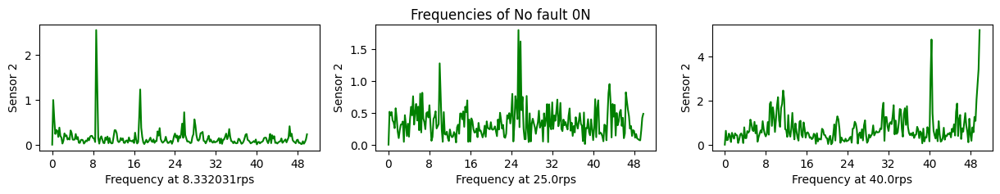

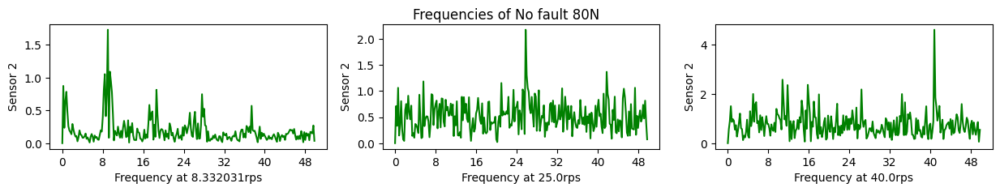

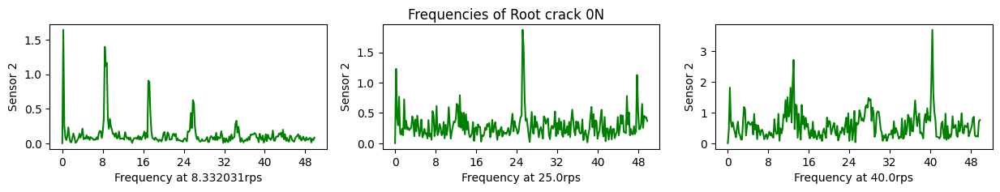

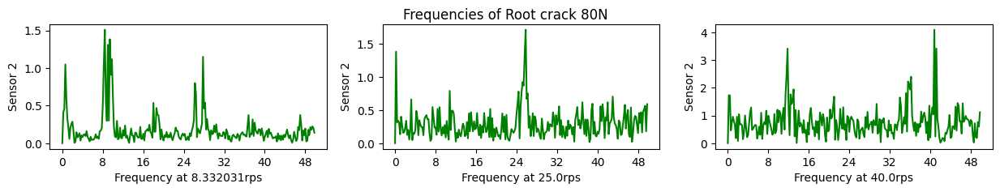

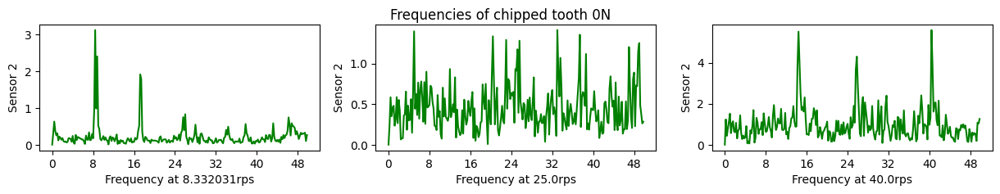

...

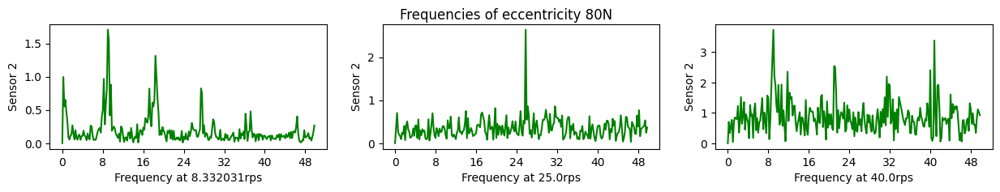

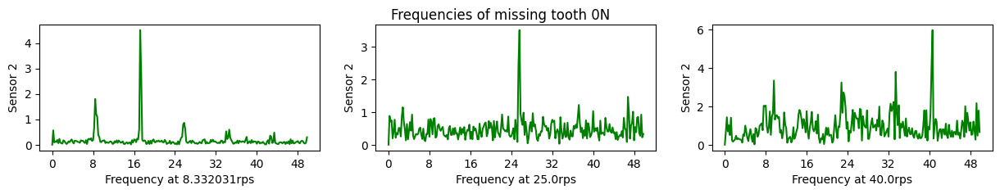

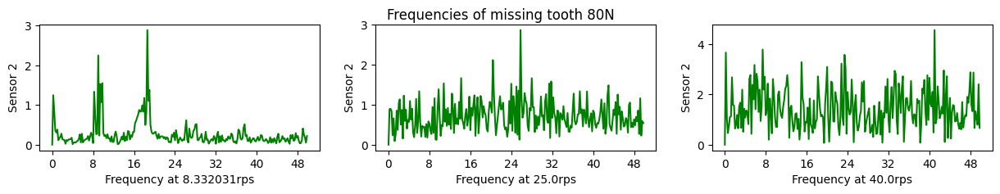

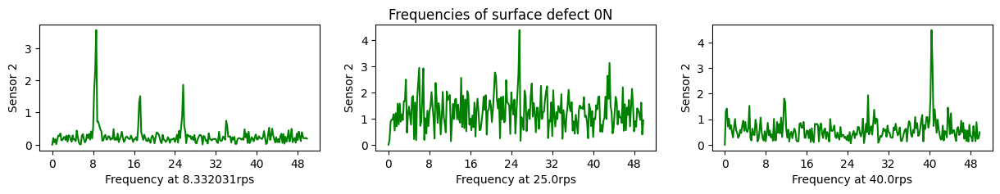

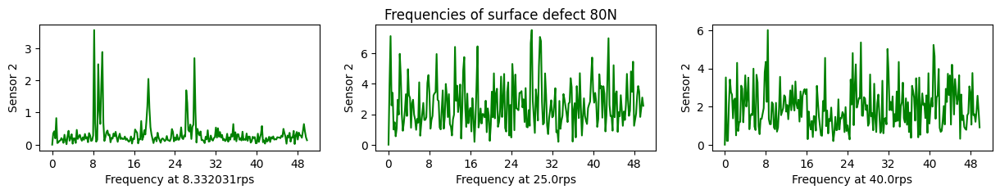

In [33]:
for fault in sorted(df['fault'].unique()):
    for load in load_lst:
        fig, ax = plt.subplots(1, 3, figsize=(15, 2))
        fig.suptitle('Frequencies of ' + fault + ' ' + str(load) + 'N')
        
        for i, speed in enumerate(sorted(df['speed'].unique())):    
            measurements = df.loc[(df['fault'] == fault) & (df['load'] == load) & (df['speed'] == speed), 'sensor2']
            
            yf = rfft(measurements.values[:25000])[:250]
            yf = np.abs(yf)
            yf[0] = 0
            xf = rfftfreq(measurements.shape[0], 1/5000)[:250]               
            
            sns.lineplot(x=xf, y=yf, ax=ax[i], color='g')
            ax[i].set_xlabel('Frequency at ' + str(speed) + 'rps')
            ax[i].set_ylabel('Sensor 2')
            ax[i].set_xticks(range(0, 50, 8))
        
        plt.show()

On the plots above we can see, that each run has it's unique spectrum peaks' pattern. Looks like these peaks can be used for speed estimation.

### Conclusion

The dataset has data as per description, without missed values. Each gearbox run was performed in different time, resulting in non-overlapping readings time that can be used as index in time series.<br/>
The dataset provides axial and radial shaft vibration readings. The readings have visible trend. The data has multiple seasonal patterns with non linear behavior. Every gear fault significantly changes readings' pattern. Frequency plots provide best visible changes in vibrations between different runs.